In [43]:
import pathlib
import cv2
import numpy as np
import time

from tqdm import tqdm

from matplotlib import pyplot as plt
from mpl_toolkits.axes_grid1 import ImageGrid
from skimage import data, img_as_float
from skimage.measure import compare_ssim as ssim


def calculate_t_frames(file_path, scaling=None):
    img_arr = None
    #for current_file in tqdm(sorted(pathlib.Path(file_path).iterdir())):
    for current_file in sorted(pathlib.Path(file_path).iterdir()):

        file_string = str(current_file)
        img = cv2.imread(file_string, flags=cv2.IMREAD_GRAYSCALE)
            
        if scaling is not None:
            img = cv2.resize(img, None,
                             fx=scaling, fy=scaling, 
                             interpolation=cv2.INTER_AREA)
        if img_arr is None:
            height, width = np.shape(img)[:2]
            flat_d = height * width
            img_arr = np.zeros((flat_d,0))
            
            # Show scaled image for exploring
            fig = plt.figure()
            fig.add_subplot(1,1,1)
            img = img_as_float(img)
            plt.imshow(img, cmap=plt.cm.gray, vmin=0, vmax=1)
            plt.show()
                    
        img_1d = np.expand_dims(np.ravel(img), axis=1)
        img_arr = np.append(img_arr, img_1d, axis=1)

    img_diff = np.diff(img_arr)
    img_norms = np.linalg.norm(img_diff, axis=0)
    
    avg = np.mean(img_norms)
    std = np.std(img_norms)
    transition_frames = np.argwhere(img_norms > avg).flatten()
    transition_values = img_norms[img_norms > avg]
    transition_frames_std = np.argwhere(img_norms > avg+std).flatten()
    transition_values_std = img_norms[img_norms > avg+std]

    return (transition_frames, transition_values, 
            avg, std,
            transition_frames_std, transition_values_std)

def get_files_list(file_path, transition_frames):
    files_list = list()
    first_file = sorted(pathlib.Path(file_path).iterdir())[0]
    start_int = int(first_file.stem)
    #for i in tqdm(transition_frames):
    for i in transition_frames:
        files_list.append(str(pathlib.Path(file_path)
                      .joinpath('{:03d}.jpg'.format(i+start_int))))
    return files_list

def display_images(files_list):
    fig = plt.figure(1, (14., 10.))
    img_per_row = 7
    grid = ImageGrid(fig, 111,  # similar to subplot(111)
                 nrows_ncols=(len(files_list)//img_per_row+1, img_per_row),  # creates 2x2 grid of axes
                 axes_pad=0.05,  # pad between axes in inch.
                 )
    #for i,f in tqdm(enumerate(files_list)):
    for i,f in enumerate(files_list):
        img = cv2.imread(f)
        img = img_as_float(img)
        grid[i].axis('off')
        grid[i].imshow(img, cmap=plt.cm.gray, vmin=0, vmax=1)
    return grid

In [44]:
def run(file_path):
    scaling_options = [0.001, 0.002, 0.005, 0.01, 0.1]
    for scaling in scaling_options:
        print("scale: {}".format(scaling))
        (transition_frames, transition_values, 
         avg, std,
         transition_frames_std, transition_values_std) = calculate_t_frames(file_path, scaling)
        files_list = get_files_list(file_path, transition_frames)
        display_images(files_list)
        plt.show()
        
        print("Count: {}\nT_Frames List: {}\nAvg: {} Std: {}\nValues: {}".format(len(transition_frames), 
                                                                        transition_frames, 
                                                                        avg, std, 
                                                                        transition_values))
        
        time.sleep(1)
        
        files_list = get_files_list(file_path, transition_frames_std)
        display_images(files_list)
        plt.show()
        print("Count: {}\nSTD List: {}\nAvg: {} Std: {}\nValues: {}".format(len(transition_frames_std), 
                                                                        transition_frames_std, 
                                                                        avg, std, 
                                                                        transition_values))

scale: 0.001


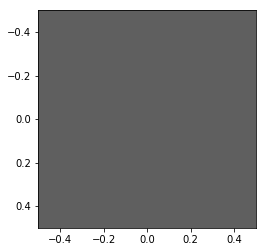

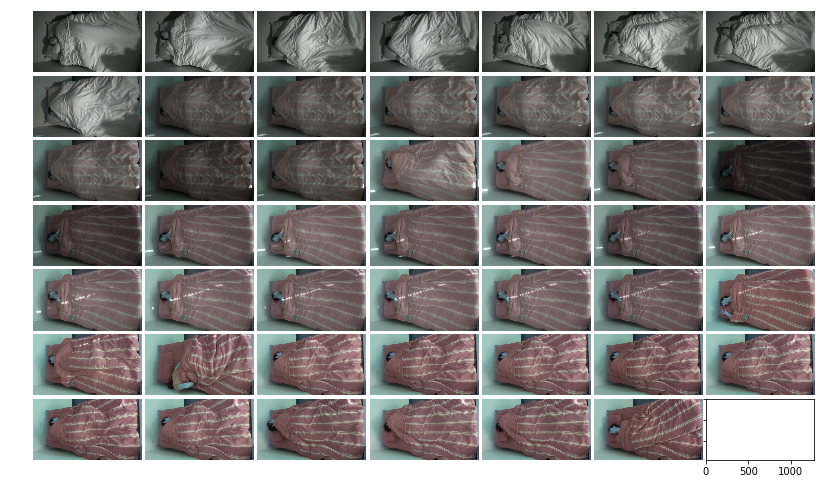

Count: 48
T_Frames List: [  0  51  98 153 154 193 194 221 222 223 224 225 226 227 228 229 230 238
 240 241 244 245 246 248 249 250 251 252 253 259 260 261 262 263 268 281
 282 283 284 287 288 296 297 298 299 300 301 302]
Avg: 2.383642930856553 Std: 8.392294652721379
Values: [105.62745098   3.           3.           5.           5.
   4.           3.          44.           7.          11.
   4.           3.           4.          13.          31.
  23.          33.           4.          22.          44.
  22.          32.          16.          14.           9.
  21.          27.           3.           4.           6.
   7.           3.          12.          15.           3.
   6.           6.           5.           5.          11.
  12.           3.           5.          11.          10.
   4.           8.           6.        ]


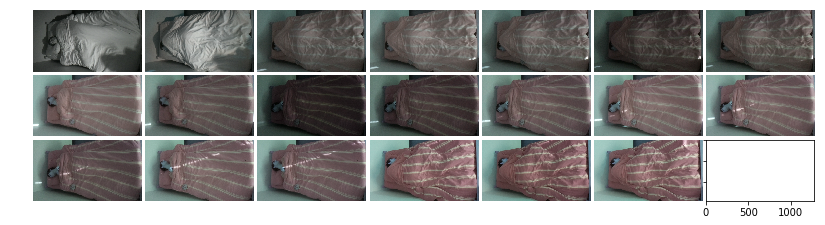

Count: 20
STD List: [  0 221 223 227 228 229 230 240 241 244 245 246 248 250 251 262 263 287
 288 298]
Avg: 2.383642930856553 Std: 8.392294652721379
Values: [105.62745098   3.           3.           5.           5.
   4.           3.          44.           7.          11.
   4.           3.           4.          13.          31.
  23.          33.           4.          22.          44.
  22.          32.          16.          14.           9.
  21.          27.           3.           4.           6.
   7.           3.          12.          15.           3.
   6.           6.           5.           5.          11.
  12.           3.           5.          11.          10.
   4.           8.           6.        ]
scale: 0.002


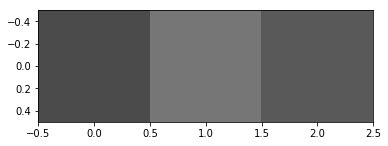

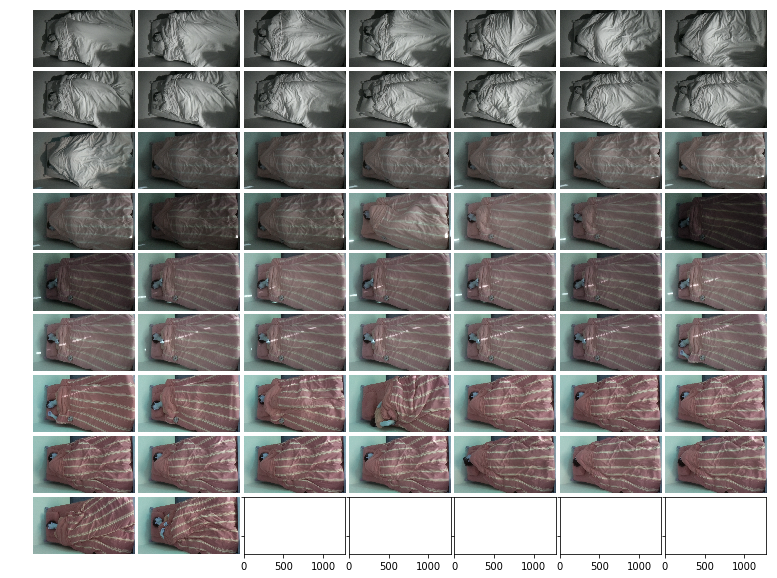

Count: 58
T_Frames List: [  0  50  51  81  90  97  98 154 159 181 184 193 194 195 221 222 223 224
 225 226 227 228 229 230 238 240 241 244 245 246 248 249 250 251 252 253
 259 260 261 262 263 267 268 280 281 282 283 284 287 288 296 297 298 299
 300 301 302 303]
Avg: 4.7724461515295316 Std: 14.823213518453358
Values: [185.86873322  13.15294644   5.83095189   9.94987437  12.36931688
   8.30662386   5.83095189   8.1240384    7.34846923   5.65685425
   6.40312424   8.30662386   5.83095189   8.77496439  71.23201527
  13.3041347   19.6468827    8.77496439   5.83095189   6.40312424
  23.68543856  57.38466694  42.29657197  61.26989473  20.14944168
  37.58989226  79.68688725  39.26830783  54.27706698  28.33725463
  23.68543856  15.03329638  35.25620513  47.96873982   7.
   5.83095189   9.8488578   11.5758369    5.19615242  20.22374842
  25.98076211  13.49073756   5.83095189  15.29705854   8.60232527
  13.92838828  11.09053651  10.48808848  22.04540769  23.15167381
   7.14142843   9.38083152  22

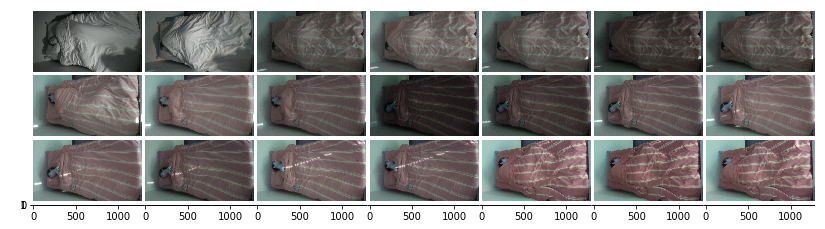

Count: 21
STD List: [  0 221 223 227 228 229 230 238 240 241 244 245 246 248 250 251 262 263
 287 288 298]
Avg: 4.7724461515295316 Std: 14.823213518453358
Values: [185.86873322  13.15294644   5.83095189   9.94987437  12.36931688
   8.30662386   5.83095189   8.1240384    7.34846923   5.65685425
   6.40312424   8.30662386   5.83095189   8.77496439  71.23201527
  13.3041347   19.6468827    8.77496439   5.83095189   6.40312424
  23.68543856  57.38466694  42.29657197  61.26989473  20.14944168
  37.58989226  79.68688725  39.26830783  54.27706698  28.33725463
  23.68543856  15.03329638  35.25620513  47.96873982   7.
   5.83095189   9.8488578   11.5758369    5.19615242  20.22374842
  25.98076211  13.49073756   5.83095189  15.29705854   8.60232527
  13.92838828  11.09053651  10.48808848  22.04540769  23.15167381
   7.14142843   9.38083152  22.56102835  16.76305461   8.77496439
  16.1245155   12.9614814    9.89949494]
scale: 0.005


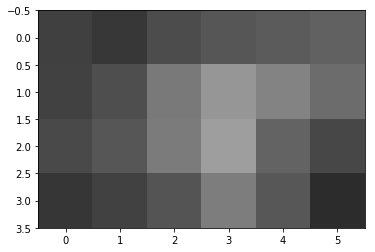

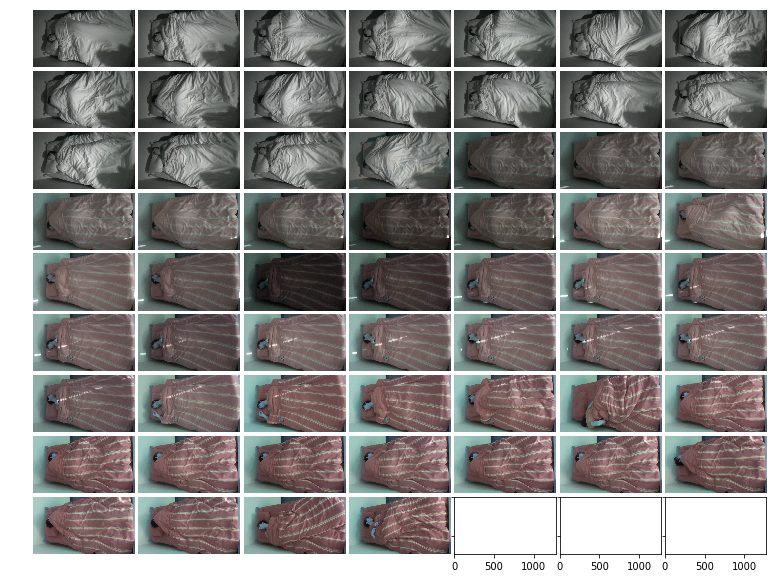

Count: 60
T_Frames List: [  0  50  51  52  81  90  91  97  98 153 154 159 181 184 193 194 195 221
 222 223 224 226 227 228 229 230 237 238 240 241 244 245 246 248 249 250
 251 252 253 259 260 262 263 267 268 280 281 282 283 284 287 288 296 297
 298 299 300 301 302 303]
Avg: 15.234185938933951 Std: 42.533708739042524
Values: [525.43489349  60.52272301  15.58845727  20.19900988  53.55371136
  62.6019169   17.34935157  37.2961124   17.23368794  69.8140387
  22.24859546  33.13608305  26.96293753  24.35159132  30.43024811
  15.58845727  47.0637865  234.1367122   34.7706773   52.1440313
  22.8035085   18.78829423  64.99230724 151.51897571 112.88489713
 163.40746617  34.13209633  73.63423117 104.89995234 217.02764801
 106.59737333 152.95424152  79.13911801  66.92533153  42.29657197
 100.32945729 132.71021061  16.21727474  17.57839583  28.47806173
  32.43454948  57.92236183  72.61542536  44.17012565  23.76972865
  46.13025038  40.63249931  60.47313453  27.45906044  26.70205985
  56.89463947  6

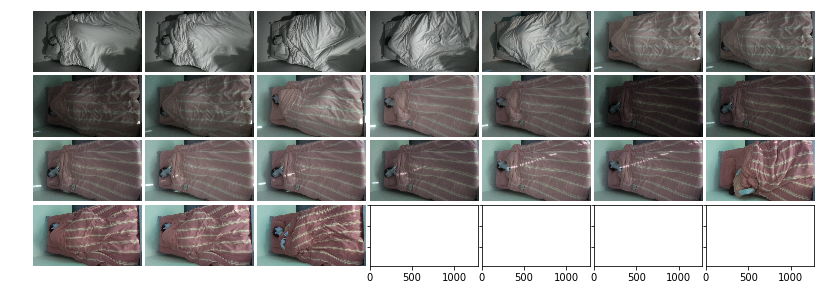

Count: 24
STD List: [  0  50  90 153 221 227 228 229 230 238 240 241 244 245 246 248 250 251
 262 263 282 288 298 303]
Avg: 15.234185938933951 Std: 42.533708739042524
Values: [525.43489349  60.52272301  15.58845727  20.19900988  53.55371136
  62.6019169   17.34935157  37.2961124   17.23368794  69.8140387
  22.24859546  33.13608305  26.96293753  24.35159132  30.43024811
  15.58845727  47.0637865  234.1367122   34.7706773   52.1440313
  22.8035085   18.78829423  64.99230724 151.51897571 112.88489713
 163.40746617  34.13209633  73.63423117 104.89995234 217.02764801
 106.59737333 152.95424152  79.13911801  66.92533153  42.29657197
 100.32945729 132.71021061  16.21727474  17.57839583  28.47806173
  32.43454948  57.92236183  72.61542536  44.17012565  23.76972865
  46.13025038  40.63249931  60.47313453  27.45906044  26.70205985
  56.89463947  60.63002556  19.87460691  26.21068484  68.42514158
  49.77951386  24.04163056  47.07440918  50.41825066  89.17398724]
scale: 0.01


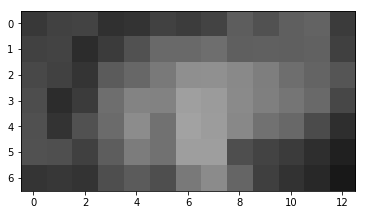

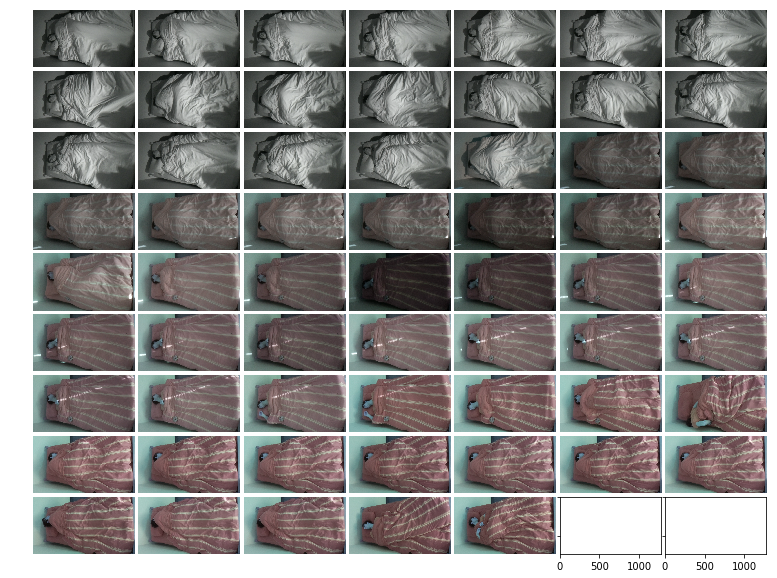

Count: 61
T_Frames List: [  0  21  22  50  52  67  81  90  91  97 153 154 159 169 181 184 193 195
 221 222 223 224 226 227 228 229 230 237 238 240 241 244 245 246 248 249
 250 251 252 259 260 262 263 265 267 268 280 281 282 283 284 287 288 296
 297 298 299 300 301 302 303]
Avg: 34.779200401732574 Std: 86.82255909537076
Values: [1027.64530006   36.68787266   39.97499218  162.39458119   64.40496875
   40.55859958  180.04721603  208.5353687    62.08059278  128.37055737
  170.94736032   45.01110974  119.71215477   48.95916666  101.87737727
  105.0428484   116.66190466  164.92422502  460.92515661   72.00694411
  104.85227704   45.33210783   39.29376541  129.34063553  301.58415078
  225.02222112  324.9492268   113.83760363  175.63314038  207.74744282
  432.95496302  215.34391099  299.72654203  155.67273364  132.27622613
   84.1011296   198.51196437  263.14824719   46.19523785   55.35341001
   63.26136262  112.67652817  141.5344481    52.92447449   93.54143467
   72.4844811   111.90174261  12

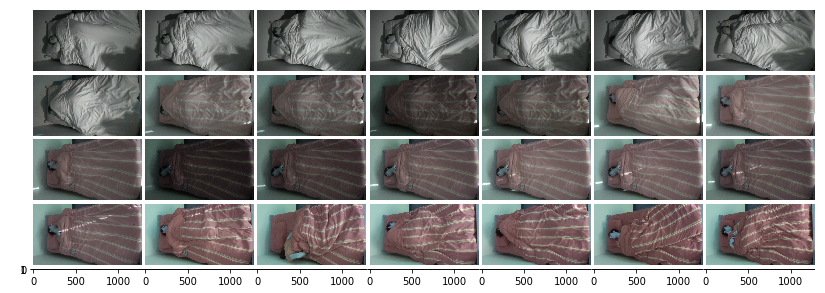

Count: 28
STD List: [  0  50  81  90  97 153 195 221 227 228 229 230 238 240 241 244 245 246
 248 250 251 263 281 282 298 301 302 303]
Avg: 34.779200401732574 Std: 86.82255909537076
Values: [1027.64530006   36.68787266   39.97499218  162.39458119   64.40496875
   40.55859958  180.04721603  208.5353687    62.08059278  128.37055737
  170.94736032   45.01110974  119.71215477   48.95916666  101.87737727
  105.0428484   116.66190466  164.92422502  460.92515661   72.00694411
  104.85227704   45.33210783   39.29376541  129.34063553  301.58415078
  225.02222112  324.9492268   113.83760363  175.63314038  207.74744282
  432.95496302  215.34391099  299.72654203  155.67273364  132.27622613
   84.1011296   198.51196437  263.14824719   46.19523785   55.35341001
   63.26136262  112.67652817  141.5344481    52.92447449   93.54143467
   72.4844811   111.90174261  128.49902723  161.23895311   55.12712581
   53.68426213  112.16505695  119.37336386   40.43513324   50.81338406
  159.61202962   98.68130522 

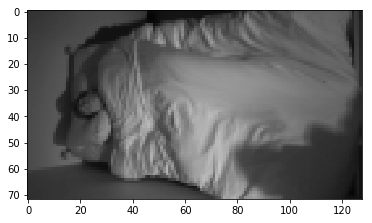

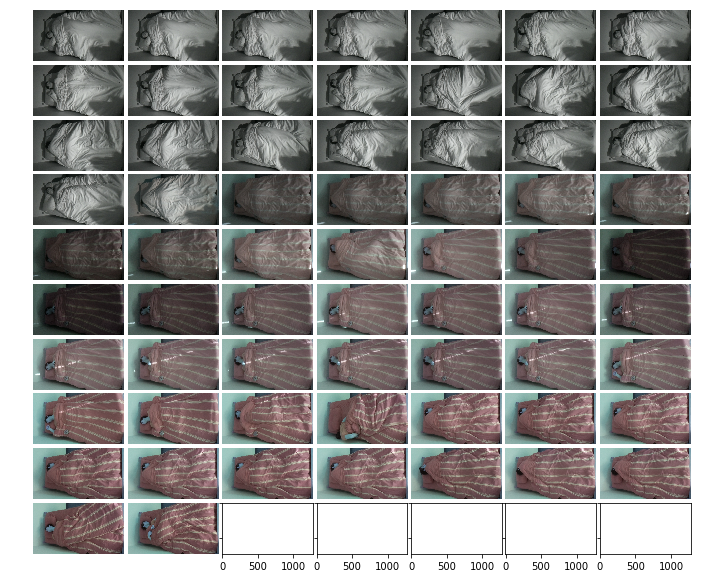

Count: 65
T_Frames List: [  0  12  20  21  22  33  50  52  67  76  81  90  91  97 121 153 159 169
 181 184 193 195 221 222 223 224 227 228 229 230 237 238 240 241 242 244
 245 246 248 249 250 251 252 259 260 262 263 265 267 268 280 281 282 283
 284 287 288 296 297 298 299 300 301 302 303]
Avg: 501.66885457851765 Std: 1005.5859886070751
Values: [10521.51787156   738.00406503   595.15124128  1023.72603757
  1106.40724871   973.17521547  2512.65636329  1216.28532837
  1084.71332618   825.17513293  2984.95393599  3333.01755171
  1633.21798912  2574.20725661   722.40777958  2840.77190214
  2302.42763187  1091.82049807  2044.63713162  1947.97920933
  2372.56274943  2921.83503983  4853.44805267   749.78196831
  1070.9196982    528.72960954  1333.76909546  3049.15693266
  2288.60809227  3279.22216387  2052.41370099  2512.55945203
  2098.59381492  4366.96519336   596.50901083  2185.40179372
  3045.82993616  1583.07675114  1357.08547999   912.83459619
  2031.07139215  2667.42834955   969.4286977

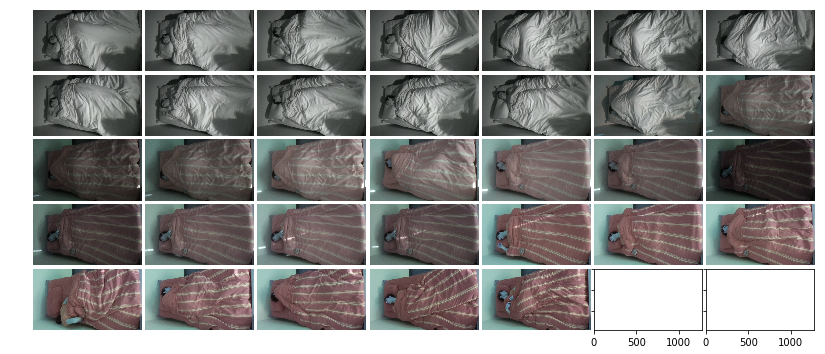

Count: 33
STD List: [  0  50  81  90  91  97 153 159 181 184 193 195 221 228 229 230 237 238
 240 241 244 245 246 250 251 268 280 281 282 298 301 302 303]
Avg: 501.66885457851765 Std: 1005.5859886070751
Values: [10521.51787156   738.00406503   595.15124128  1023.72603757
  1106.40724871   973.17521547  2512.65636329  1216.28532837
  1084.71332618   825.17513293  2984.95393599  3333.01755171
  1633.21798912  2574.20725661   722.40777958  2840.77190214
  2302.42763187  1091.82049807  2044.63713162  1947.97920933
  2372.56274943  2921.83503983  4853.44805267   749.78196831
  1070.9196982    528.72960954  1333.76909546  3049.15693266
  2288.60809227  3279.22216387  2052.41370099  2512.55945203
  2098.59381492  4366.96519336   596.50901083  2185.40179372
  3045.82993616  1583.07675114  1357.08547999   912.83459619
  2031.07139215  2667.42834955   969.42869774   677.80380642
   749.4464624   1195.97491612  1474.05020267  1303.15540132
  1167.1516611   1507.33340705  2158.48372706  2694.82708

In [45]:
run('./test_data/2019-03-03/')


scale: 0.001


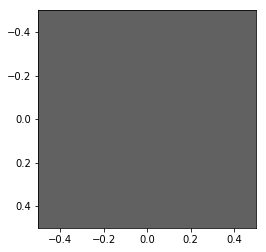

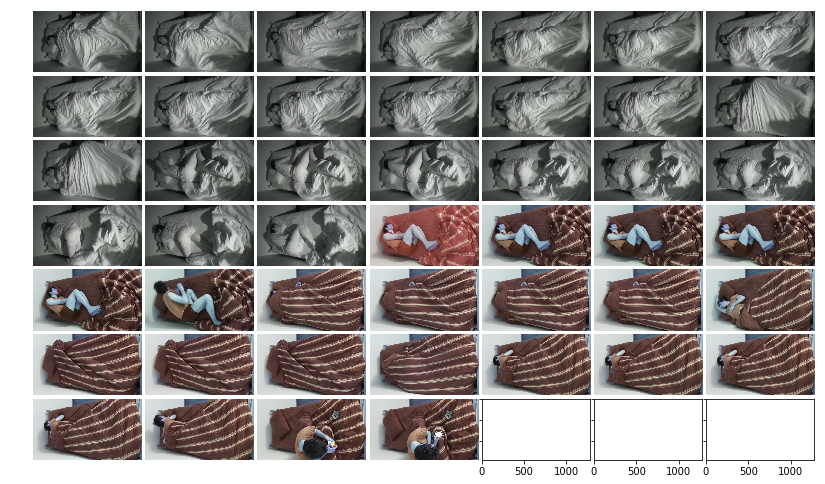

Count: 46
T_Frames List: [  0  13  14  41  42  58  60  61  64  66  67  85 111 112 135 136 137 155
 162 163 197 220 221 263 264 265 267 268 282 283 285 286 287 288 289 290
 291 293 295 304 305 307 308 309 310 311]
Avg: 0.803255404725993 Std: 6.215967190191999
Values: [104.61568627   5.           7.           3.           1.
   2.           1.           1.           1.           1.
   1.           1.           2.           1.          20.
  13.           3.           2.           1.           1.
   2.           7.           5.          18.          11.
   1.           1.           1.           2.           7.
   1.           1.           1.           1.           4.
   1.           1.           3.           1.           1.
   1.           1.           2.           3.           1.
   1.        ]


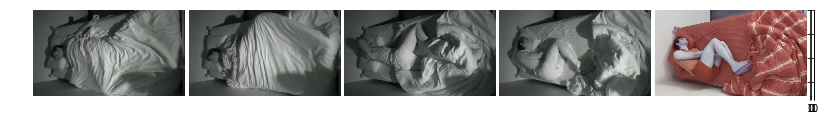

Count: 5
STD List: [  0 135 136 263 264]
Avg: 0.803255404725993 Std: 6.215967190191999
Values: [104.61568627   5.           7.           3.           1.
   2.           1.           1.           1.           1.
   1.           1.           2.           1.          20.
  13.           3.           2.           1.           1.
   2.           7.           5.          18.          11.
   1.           1.           1.           2.           7.
   1.           1.           1.           1.           4.
   1.           1.           3.           1.           1.
   1.           1.           2.           3.           1.
   1.        ]
scale: 0.002


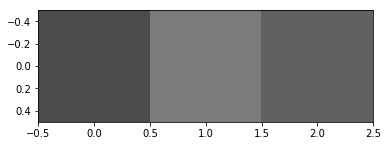

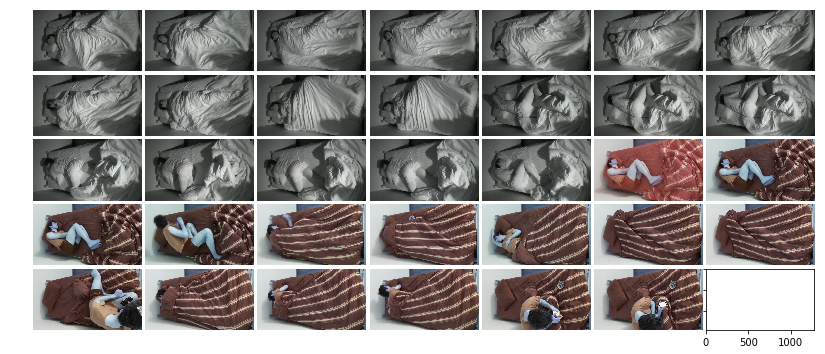

Count: 34
T_Frames List: [  0  13  14  29  41  58  84  85 111 112 135 136 137 155 197 220 221 227
 263 264 265 282 283 284 288 289 290 293 294 303 308 309 310 311]
Avg: 2.2876759768825705 Std: 11.75231067385263
Values: [184.45943585  10.29563014  12.20655562   5.74456265   6.164414
   7.28010989   6.08276253   3.31662479   8.71779789   2.44948974
  41.10960958  23.72762104   4.69041576   8.83176087   8.83176087
  11.40175425   8.66025404   2.82842712  64.84597135  30.757113
   2.82842712  10.67707825  26.4952826    3.60555128   6.08276253
  19.79898987   6.164414    15.93737745  21.28379665   5.83095189
   6.           7.21110255   4.24264069  10.04987562]


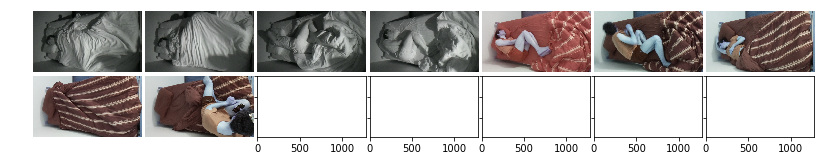

Count: 9
STD List: [  0 135 136 263 264 283 289 293 294]
Avg: 2.2876759768825705 Std: 11.75231067385263
Values: [184.45943585  10.29563014  12.20655562   5.74456265   6.164414
   7.28010989   6.08276253   3.31662479   8.71779789   2.44948974
  41.10960958  23.72762104   4.69041576   8.83176087   8.83176087
  11.40175425   8.66025404   2.82842712  64.84597135  30.757113
   2.82842712  10.67707825  26.4952826    3.60555128   6.08276253
  19.79898987   6.164414    15.93737745  21.28379665   5.83095189
   6.           7.21110255   4.24264069  10.04987562]
scale: 0.005


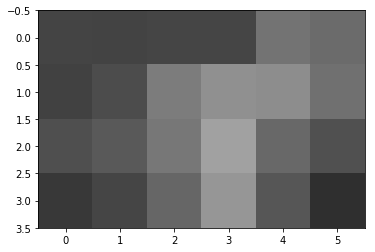

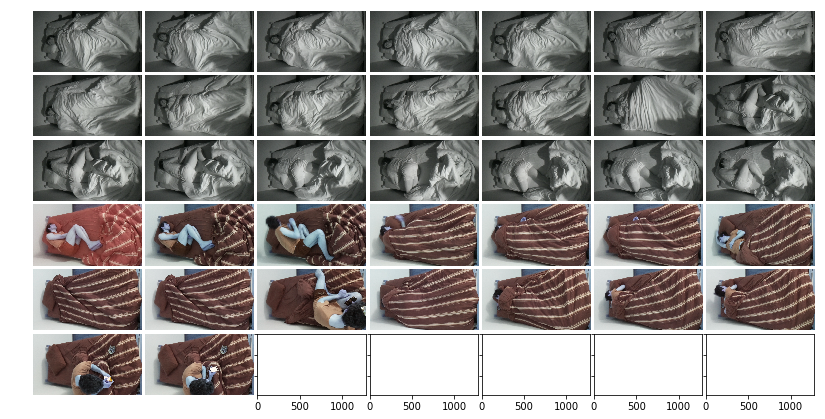

Count: 37
T_Frames List: [  0   6   7   8  13  14  29  41  58  84  85 111 135 136 137 155 197 220
 221 227 263 264 282 283 284 285 288 289 290 293 294 300 303 308 309 310
 311]
Avg: 10.075715986562319 Std: 38.808053441637064
Values: [524.76427103  28.37252192  10.34408043  10.58300524  50.72474741
  32.57299495  47.39198244  59.54829972  41.0487515   23.57965225
  15.29705854  55.00909016 146.2224333   66.5357047   12.36931688
  47.14870094  57.01754116  92.68225289  23.2594067   46.34652091
 265.3469427   84.61678321  67.47592163 104.01922899  29.58039892
  11.22497216  71.58212067  94.63614531  12.24744871 133.0488632
 130.31116606  45.80392996  32.48076354  28.58321186  82.61961026
  60.65476074  96.05206921]


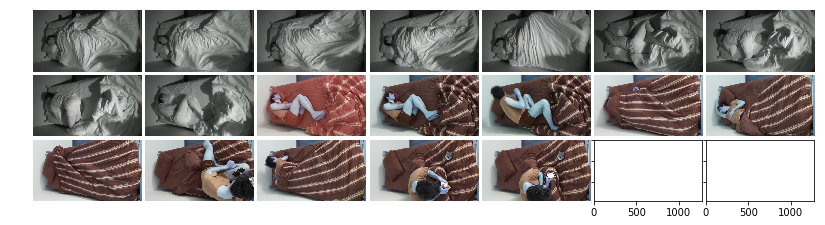

Count: 19
STD List: [  0  13  41 111 135 136 197 220 263 264 282 283 288 289 293 294 309 310
 311]
Avg: 10.075715986562319 Std: 38.808053441637064
Values: [524.76427103  28.37252192  10.34408043  10.58300524  50.72474741
  32.57299495  47.39198244  59.54829972  41.0487515   23.57965225
  15.29705854  55.00909016 146.2224333   66.5357047   12.36931688
  47.14870094  57.01754116  92.68225289  23.2594067   46.34652091
 265.3469427   84.61678321  67.47592163 104.01922899  29.58039892
  11.22497216  71.58212067  94.63614531  12.24744871 133.0488632
 130.31116606  45.80392996  32.48076354  28.58321186  82.61961026
  60.65476074  96.05206921]
scale: 0.01


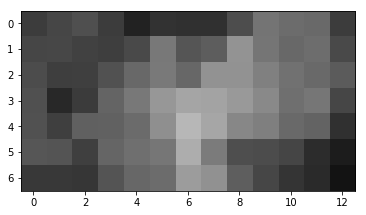

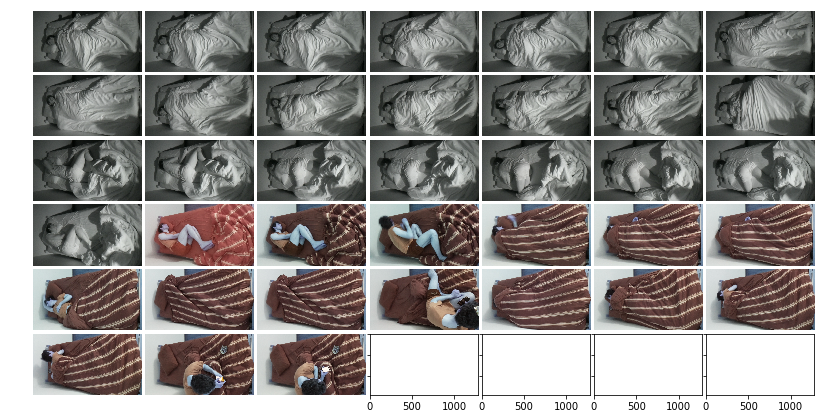

Count: 38
T_Frames List: [  0   5   6   7   8  13  14  29  41  58  84  85 111 135 136 155 162 197
 220 221 227 263 264 282 283 284 285 288 289 290 293 294 300 303 308 309
 310 311]
Avg: 24.76507166837775 Std: 83.2598208294949
Values: [1022.83089524   25.43619468   68.24954212   41.66533331   54.70831747
  118.13974776   64.07027392  117.2902383   154.45711379  104.14893182
   74.31016081   56.41808221  146.065054    346.30766668  137.36811857
  147.80730699   33.21144381  203.45761229  254.40518863   45.14421336
  138.95322954  532.55891693  179.06981879  231.86634081  317.40825446
   80.85790005   33.33166662  162.23131634  207.45601944   47.9165942
  317.77035733  323.12072047  134.78130434   95.59288676  106.43777525
  212.46646794  142.03168661  216.7579295 ]


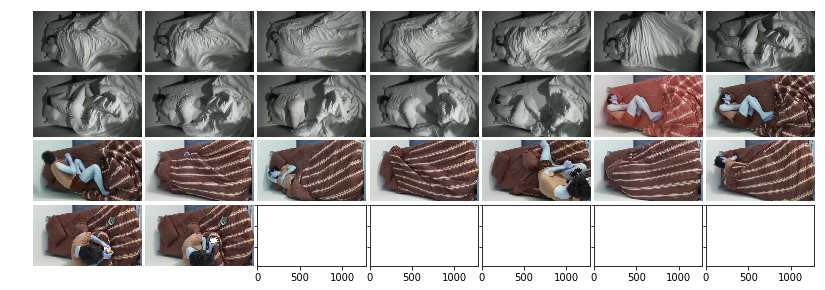

Count: 23
STD List: [  0  13  29  41 111 135 136 155 197 220 227 263 264 282 283 288 289 293
 294 300 309 310 311]
Avg: 24.76507166837775 Std: 83.2598208294949
Values: [1022.83089524   25.43619468   68.24954212   41.66533331   54.70831747
  118.13974776   64.07027392  117.2902383   154.45711379  104.14893182
   74.31016081   56.41808221  146.065054    346.30766668  137.36811857
  147.80730699   33.21144381  203.45761229  254.40518863   45.14421336
  138.95322954  532.55891693  179.06981879  231.86634081  317.40825446
   80.85790005   33.33166662  162.23131634  207.45601944   47.9165942
  317.77035733  323.12072047  134.78130434   95.59288676  106.43777525
  212.46646794  142.03168661  216.7579295 ]
scale: 0.1


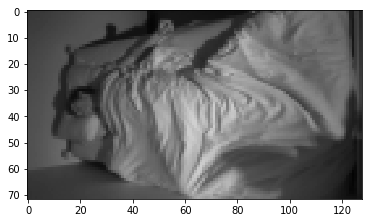

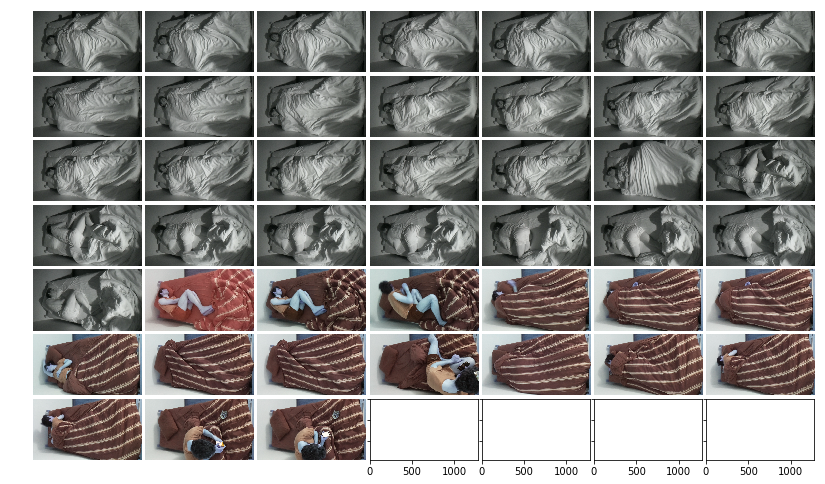

Count: 45
T_Frames List: [  0   5   6   7   8  12  13  14  29  41  57  58  64  65  66  67  84  85
 111 135 136 155 156 162 197 220 221 227 263 264 282 283 284 285 288 289
 290 293 294 300 303 308 309 310 311]
Avg: 439.72253136466503 Std: 1167.9473787581169
Values: [10497.46036196   714.62437686  1481.71657209  1193.55728811
  1093.40020121   586.19280105  2387.70622146   655.54023523
  2172.01749533  2654.01130367   748.27267757  2246.60900025
   545.46310599   722.51505175   845.78720728   682.30491717
  1911.74422975  1227.54511119  2842.99366865  4574.55145342
  1662.93806259  2930.36567684   476.89831201   867.35459877
  3250.65501092  3619.35394788   459.00762521  2606.47232865
  6432.18679766  1954.8590742   4177.39428352  5266.47500706
  3087.18512564  2011.11710251  4465.53009171  4542.76875925
   538.91001104  4781.18803228  5072.19321399  3956.91394903
  3525.90272129  1996.47013501  4303.20520078  2601.12648674
  3859.89404   ]


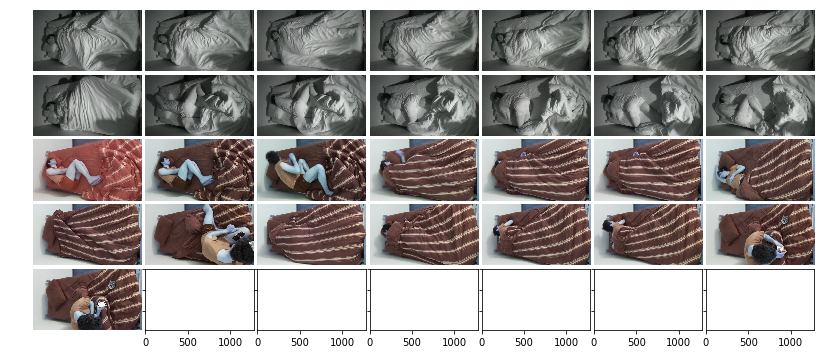

Count: 29
STD List: [  0  13  29  41  58  84 111 135 136 155 197 220 227 263 264 282 283 284
 285 288 289 293 294 300 303 308 309 310 311]
Avg: 439.72253136466503 Std: 1167.9473787581169
Values: [10497.46036196   714.62437686  1481.71657209  1193.55728811
  1093.40020121   586.19280105  2387.70622146   655.54023523
  2172.01749533  2654.01130367   748.27267757  2246.60900025
   545.46310599   722.51505175   845.78720728   682.30491717
  1911.74422975  1227.54511119  2842.99366865  4574.55145342
  1662.93806259  2930.36567684   476.89831201   867.35459877
  3250.65501092  3619.35394788   459.00762521  2606.47232865
  6432.18679766  1954.8590742   4177.39428352  5266.47500706
  3087.18512564  2011.11710251  4465.53009171  4542.76875925
   538.91001104  4781.18803228  5072.19321399  3956.91394903
  3525.90272129  1996.47013501  4303.20520078  2601.12648674
  3859.89404   ]


In [46]:
run('./test_data/2019-03-13/')
